# MSML651 Project: Predicting Sentiment of Tweets Using the Sentiment140 Dataset

- Name: Aditya Patkar
- UID: 119390818

# Step 1: Installing and importing necessary libraries

In [1]:
!pip install awscli

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 33.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 548.2/548.2 kB 32.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 kB 5.1 MB/s eta 0:00:00
  Attempting uninstall: rsa
    Found existing installation: rsa 4.9
    Uninstalling rsa-4.9:
      Successfully uninstalled rsa-4.9
  Attempting uninstall: docutils
    Found existing installation: docutils 0.18.1
    Uninstalling docutils-0.18.1:
      Successfully uninstalled docutils-0.18.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
llmx 0.0.15a0 requires cohere, which is not installed.
llmx 0.0.15a0 requires openai, which is not installed.
llmx 0.0.15a0 requires tiktoken, which is not installed.


In [2]:
from google.colab import userdata
access_key = userdata.get('AWS_ACCESS_KEY_ID')
secret_key = userdata.get('AWS_SECRET_ACCESS_KEY')

!aws configure set aws_access_key_id $access_key
!aws configure set aws_secret_access_key $secret_key
!aws configure set default.region us-east-1

In [3]:
#Load Libraries
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pi.express as px
import random
from bs4 import BeautifulSoup
import re
from nltk.tokenize import WordPunctTokenizer
import dask.dataframe as dd
from dask.diagnostics import ProgressBar
from dask.distributed import progress
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# Step 2: Loading the data

In [4]:
!aws s3 cp s3://msml651/sentiment140.csv /content

download: s3://msml651/sentiment140.csv to ./sentiment140.csv       


In [5]:
#read the data
df = pd.read_csv("/content/sentiment140.csv", encoding='latin-1')

In [7]:
df.head()

,target,tweet_id,date,query_flag,user_name,tweet
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."


In [8]:
#convert to a dask DF
ddf = dd.from_pandas(df, npartitions=8)

In [9]:
#get pre clean length
ddf['post_clean_length'] = 0
ddf['pre_clean_length'] = 0
ddf['pre_clean_words'] = ddf['tweet'].apply(lambda x: len(x.split())).compute()
ddf['post_clean_words'] = 0

In [10]:
ddf.head()

,target,tweet_id,date,query_flag,user_name,tweet,post_clean_length,pre_clean_length,pre_clean_words,post_clean_words
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t...",0,0,19,0
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...,0,0,21,0
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...,0,0,18,0
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire,0,0,10,0
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all....",0,0,21,0


## Step 3: Looking at the data and basic statistics

In [11]:
#check the first few rows
ddf.head()

,target,tweet_id,date,query_flag,user_name,tweet,post_clean_length,pre_clean_length,pre_clean_words,post_clean_words
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t...",0,0,19,0
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...,0,0,21,0
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...,0,0,18,0
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire,0,0,10,0
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all....",0,0,21,0


In [12]:
ddf.info()
#can see that no column is null

<class 'dask.dataframe.core.DataFrame'>
Columns: 10 entries, target to post_clean_words
dtypes: object(4), int64(6)

In [13]:
ddf.describe().compute()

,target,tweet_id,post_clean_length,pre_clean_length,pre_clean_words,post_clean_words
count,1.600000e+06,1.600000e+06,1600000.0,1600000.0,1.600000e+06,1600000.0
mean,2.000000e+00,1.998818e+09,0.0,0.0,1.317613e+01,0.0
std,2.000001e+00,1.935761e+08,0.0,0.0,6.957973e+00,0.0
min,0.000000e+00,1.467810e+09,0.0,0.0,1.000000e+00,0.0
25%,0.000000e+00,1.960553e+09,0.0,0.0,8.000000e+00,0.0
50%,0.000000e+00,2.006481e+09,0.0,0.0,1.300000e+01,0.0
75%,4.000000e+00,2.183673e+09,0.0,0.0,1.900000e+01,0.0
max,4.000000e+00,2.329206e+09,0.0,0.0,6.400000e+01,0.0


In [14]:
ddf['target'].unique().compute()

0    0
1    4
Name: target, dtype: int64

In [15]:
def see_random_tweet_and_target(ddf):
  """
    Return a random tuple of tweet and target
  """
  row = random.randint(0,len(df))
  return df['tweet'][row], df['target'][row]

In [16]:
see_random_tweet_and_target(ddf)

#takeaways:
#- URLs
#- User IDs
#- Hashtags
#- &amp (HTML?)
#- Non ASCII?

('@woahhannah exactly ', 4)

# Step 3: Data Cleaning

In [17]:
def get_text_from_html(row):
  """
    The tweet seems to contain raw html like &amp. Get text for that
  """
  row['tweet'] = BeautifulSoup(row['tweet'], 'lxml').get_text()
  return row

def regex_replace(row, pattern):
  """
    Replace regex pattern with empty string
  """
  row['tweet'] = re.sub(pattern,"", row['tweet'])
  return row

def replace_non_ascii(row, placeholder="?"):
  """
    Replaces non ascii characters with placeholder
  """
  row['tweet'] = row['tweet'].decode("utf-8-sig").replace(u"\ufffd", "?")
  return row

tok = WordPunctTokenizer()

def clean_tweets(row):
  """
    Clean the tweets using above functions
  """

  #get the length of the tweet before cleaning
  row['pre_clean_length'] = len(row['tweet'])

  #convert html characters to text

  #regex replacement for username and url
  row = get_text_from_html(row)
  username = r'@[A-Za-z0-9_]+'
  website = r'https?://[^ ]+'
  website_2 = r'www.[^ ]+'
  combined_regex_pattern = r'|'.join((username, website, website_2))
  row = regex_replace(row, combined_regex_pattern)

  #replace non ascii with placeholder
  try:
    row = replace_non_ascii(row, placeholder="?")
  except:
    pass

  #keep only letters
  row['tweet'] = re.sub("[^a-zA-Z]", " ", row['tweet'])

  #lowercasing
  row['tweet'] = row['tweet'].lower()

  #split negation words
  negative_dic = {"isn't":"is not", "aren't":"are not", "wasn't":"was not", "weren't":"were not",
                "haven't":"have not","hasn't":"has not","hadn't":"had not","won't":"will not",
                "wouldn't":"would not", "don't":"do not", "doesn't":"does not","didn't":"did not",
                "can't":"can not","couldn't":"could not","shouldn't":"should not","mightn't":"might not",
                "mustn't":"must not"}
  neg_pattern = re.compile(r'\b(' + '|'.join(negative_dic.keys()) + r')\b')
  row['tweet'] = neg_pattern.sub(lambda x: negative_dic[x.group()], row['tweet'])

  #tokenize and join to get rid of additional space
  words = tok.tokenize(row['tweet'])
  row['tweet'] = " ".join(words).strip()

  #calculate post clean lengths
  row['post_clean_length'] = len(row['tweet'])
  row['post_clean_words'] = len(row['tweet'].split())
  return row





In [18]:
#apply the cleaning function
from tqdm.notebook import tqdm
tqdm.pandas()
ddf1 = ddf.apply(clean_tweets, axis=1, meta=ddf).compute()

In [19]:
ddf1.head()

,target,tweet_id,date,query_flag,user_name,tweet,post_clean_length,pre_clean_length,pre_clean_words,post_clean_words
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,awww that s a bummer you shoulda got david car...,71,115,19,17
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can t update his facebook by ...,105,111,21,22
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,i dived many times for the ball managed to sav...,73,89,18,16
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire,46,47,10,10
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,no it s not behaving at all i m mad why am i h...,88,111,21,23


In [20]:
ddf1.dropna(inplace=True)

In [21]:
ddf1.reset_index(inplace=True, drop=True)

In [22]:
np.sum(ddf1.isnull().any(axis=1))

0

In [23]:
#save cleaned data
ddf1.to_parquet('sentiment140_clean.parquet')
!aws s3 cp /content/sentiment140_clean.parquet s3://msml651

upload: ./sentiment140_clean.parquet to s3://msml651/sentiment140_clean.parquet


# Step 4: EDA


In [24]:
!aws s3 cp  s3://msml651/sentiment140_clean.parquet /content

download: s3://msml651/sentiment140_clean.parquet to ./sentiment140_clean.parquet


In [25]:
df = pd.read_parquet('/content/sentiment140_clean.parquet')

In [26]:
df.head()

,target,tweet_id,date,query_flag,user_name,tweet,post_clean_length,pre_clean_length,pre_clean_words,post_clean_words
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,awww that s a bummer you shoulda got david car...,71,115,19,17
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can t update his facebook by ...,105,111,21,22
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,i dived many times for the ball managed to sav...,73,89,18,16
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire,46,47,10,10
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,no it s not behaving at all i m mad why am i h...,88,111,21,23


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1600000 entries, 0 to 1599999
Data columns (total 10 columns):
 #   Column             Non-Null Count    Dtype 
---  ------             --------------    ----- 
 0   target             1600000 non-null  int64 
 1   tweet_id           1600000 non-null  int64 
 2   date               1600000 non-null  object
 3   query_flag         1600000 non-null  object
 4   user_name          1600000 non-null  object
 5   tweet              1600000 non-null  object
 6   post_clean_length  1600000 non-null  int64 
 7   pre_clean_length   1600000 non-null  int64 
 8   pre_clean_words    1600000 non-null  int64 
 9   post_clean_words   1600000 non-null  int64 
dtypes: int64(6), object(4)
memory usage: 122.1+ MB


## 1. Histograms

In [28]:
fig = px.box(df, y="pre_clean_length")
fig.show()

In [29]:
fig = px.histogram(df, x="pre_clean_length")
fig.show()

In [30]:
fig = px.histogram(df, x="post_clean_length", color="target")
fig.show()

Inference:

- Some tweets have more characters than allowed before cleaning, many outliers
- After cleaning, outliers are gone
- Not much difference between targets

## 2. Wordcloud

In [31]:
!pip install wordcloud

In [32]:
from wordcloud import WordCloud
from tqdm.notebook import tqdm
tqdm.pandas()

In [33]:
def get_wordcloud(df, target=0):
  """
  Display the word cloud for the given target
  """
  word_string = []
  filtered_tweets = df[df.target == target]
  for tweet in tqdm(filtered_tweets['tweet']):
    word_string.append(tweet)

  word_string = pd.Series(word_string).str.cat(sep=' ')
  wordcloud = WordCloud(width=1600, height=800,max_font_size=200).generate(word_string)
  plt.figure(figsize=(12,10))
  plt.imshow(wordcloud, interpolation="bilinear")
  plt.axis("off")
  plt.show()


  0%|          | 0/800000 [00:00<?, ?it/s]

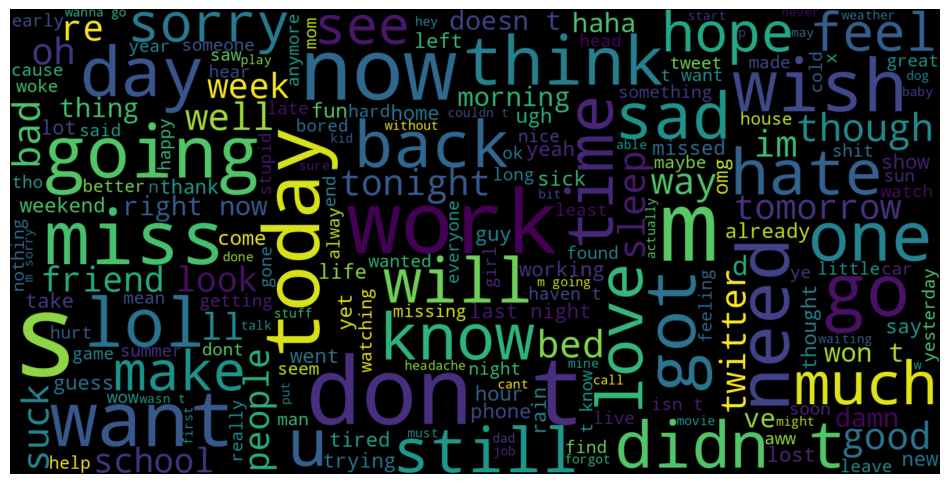

In [34]:
get_wordcloud(df, target=0)

  0%|          | 0/800000 [00:00<?, ?it/s]

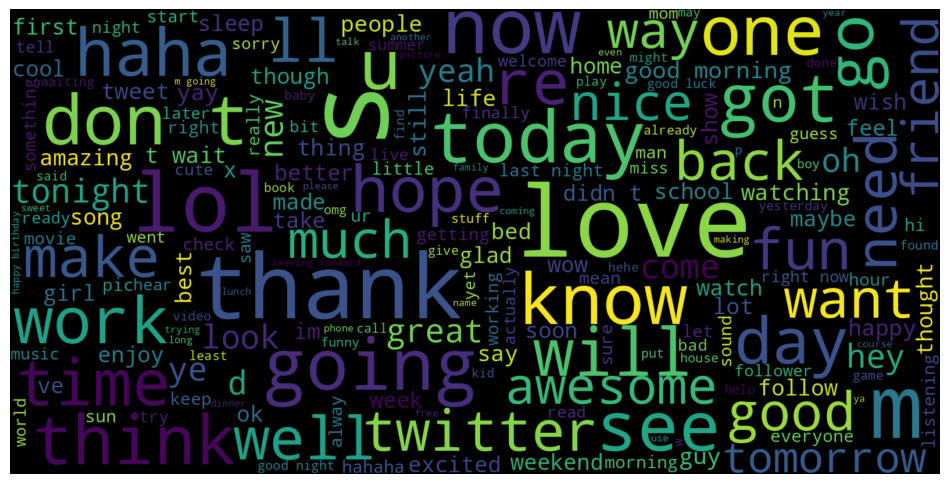

In [35]:
get_wordcloud(df, target=4)

In [40]:
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')


stop = stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [41]:
ddf = dd.from_pandas(df, npartitions=8)
ddf['tweet_without_stopwords'] = ""

In [42]:
def remove_stopwords(row):
  """
  Remove stopwords
  """
  tweet = row['tweet']
  tweet_without_stopwords = [item for item in tweet.split() if item not in stop]
  row['post_clean_words'] = len(tweet_without_stopwords)
  row['tweet_without_stopwords'] = " ".join(tweet_without_stopwords)
  row['post_clean_length'] = len(row['tweet_without_stopwords'])
  return row

In [43]:
df.columns

Index(['target', 'tweet_id', 'date', 'query_flag', 'user_name', 'tweet',
       'post_clean_length', 'pre_clean_length', 'pre_clean_words',
       'post_clean_words'],
      dtype='object')

In [44]:
#slow

%%time
df = df.progress_apply(remove_stopwords, axis=1)

  0%|          | 0/1600000 [00:00<?, ?it/s]

CPU times: user 20min 23s, sys: 14.5 s, total: 20min 38s
Wall time: 21min 17s


In [45]:
%%time
ddf = ddf.apply(remove_stopwords, axis=1, meta = ddf).compute()

CPU times: user 3min 18s, sys: 956 ms, total: 3min 19s
Wall time: 3min 20s


In [46]:
ddf

,target,tweet_id,date,query_flag,user_name,tweet,post_clean_length,pre_clean_length,pre_clean_words,post_clean_words,tweet_without_stopwords
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,awww that s a bummer you shoulda got david car...,44,115,19,8,awww bummer shoulda got david carr third day
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can t update his facebook by ...,69,111,21,11,upset update facebook texting might cry result...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,i dived many times for the ball managed to sav...,49,89,18,9,dived many times ball managed save rest go bounds
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire,32,47,10,6,whole body feels itchy like fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,no it s not behaving at all i m mad why am i h...,16,111,21,3,behaving mad see
...,...,...,...,...,...,...,...,...,...,...,...
1599995,4,2193601966,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,AmandaMarie1028,just woke up having no school is the best feel...,29,56,11,5,woke school best feeling ever
1599996,4,2193601969,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,TheWDBoards,thewdb com very cool to hear old walt interviews,40,78,11,7,thewdb com cool hear old walt interviews
1599997,4,2193601991,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,bpbabe,are you ready for your mojo makeover ask me fo...,31,57,11,5,ready mojo makeover ask details
1599998,4,2193602064,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,tinydiamondz,happy th birthday to my boo of alll time tupac...,50,65,12,9,happy th birthday boo alll time tupac amaru sh...


  0%|          | 0/800000 [00:00<?, ?it/s]

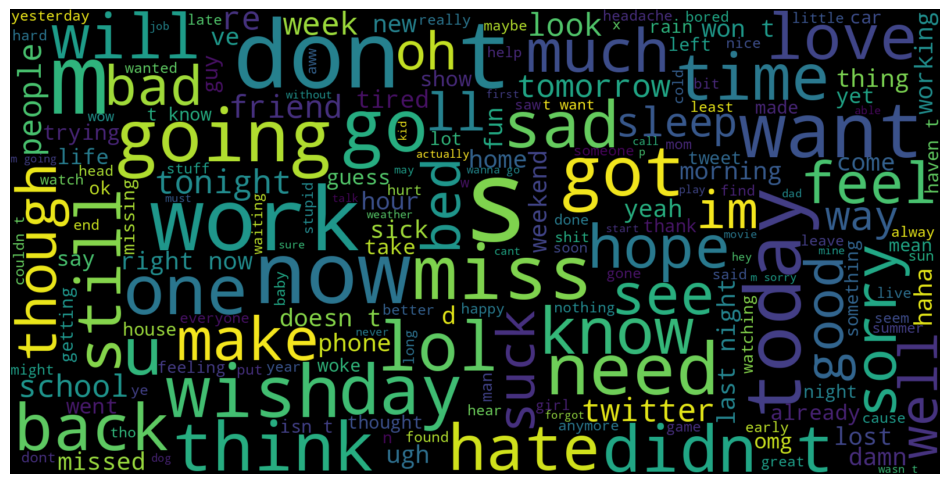

In [47]:
get_wordcloud(ddf, target=0)

  0%|          | 0/800000 [00:00<?, ?it/s]

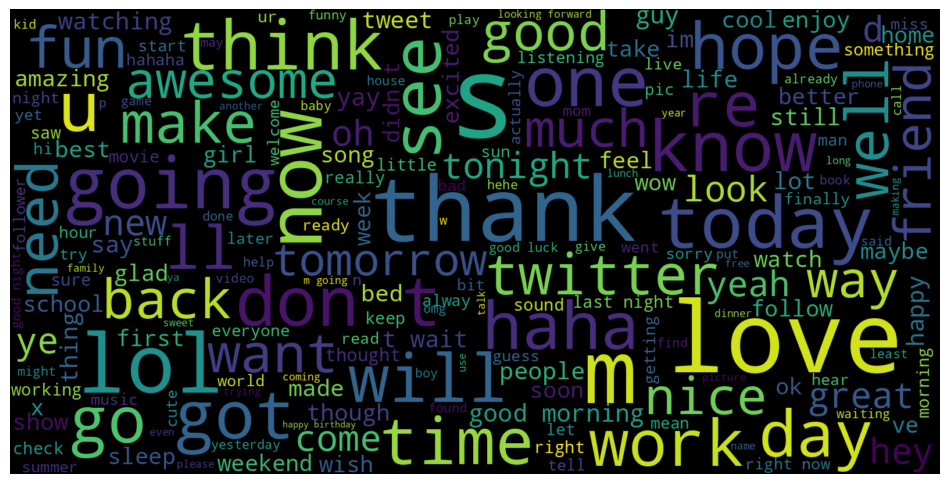

In [48]:
get_wordcloud(ddf, target=4)

In [49]:
ddf.to_parquet('sentiment140_clean_no_stopwords.parquet')
!aws s3 cp sentiment140_clean_no_stopwords.parquet s3://msml651

upload: ./sentiment140_clean_no_stopwords.parquet to s3://msml651/sentiment140_clean_no_stopwords.parquet


## 3. Word Frequency

In [50]:
!aws s3 cp  s3://msml651/sentiment140_clean_no_stopwords.parquet .

download: s3://msml651/sentiment140_clean_no_stopwords.parquet to ./sentiment140_clean_no_stopwords.parquet


In [51]:
df = pd.read_parquet('sentiment140_clean_no_stopwords.parquet')

In [52]:
df.head()

,target,tweet_id,date,query_flag,user_name,tweet,post_clean_length,pre_clean_length,pre_clean_words,post_clean_words,tweet_without_stopwords
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,awww that s a bummer you shoulda got david car...,44,115,19,8,awww bummer shoulda got david carr third day
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can t update his facebook by ...,69,111,21,11,upset update facebook texting might cry result...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,i dived many times for the ball managed to sav...,49,89,18,9,dived many times ball managed save rest go bounds
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire,32,47,10,6,whole body feels itchy like fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,no it s not behaving at all i m mad why am i h...,16,111,21,3,behaving mad see


In [53]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
from collections import Counter

# Assuming df is your original dataframe
nltk.download('punkt') # Uncomment this line if you haven't downloaded the punkt tokenizer

# Splitting the dataframe into negative and positive tweets
negative_tweets = df[df['target'] == 0]['tweet_without_stopwords']
positive_tweets = df[df['target'] == 4]['tweet_without_stopwords']

# Tokenizing the tweets
negative_words = [word_tokenize(tweet) for tweet in negative_tweets]
positive_words = [word_tokenize(tweet) for tweet in positive_tweets]

# Flattening the list of lists into a single list of words
negative_words_flat = [item for sublist in negative_words for item in sublist]
positive_words_flat = [item for sublist in positive_words for item in sublist]

# Counting the frequency of words
negative_word_counts = Counter(negative_words_flat)
positive_word_counts = Counter(positive_words_flat)

# Combining the counts into a dataframe
word_freq_df = pd.DataFrame(list(negative_word_counts.items()), columns=['word', 'negative_freq'])
word_freq_df['positive_freq'] = word_freq_df['word'].map(positive_word_counts)
word_freq_df['total_freq'] = word_freq_df['negative_freq'] + word_freq_df['positive_freq'].fillna(0)

# Filling NaN values with 0
word_freq_df.fillna(0, inplace=True)

# Converting float columns to int
word_freq_df[['negative_freq', 'positive_freq', 'total_freq']] = word_freq_df[['negative_freq', 'positive_freq', 'total_freq']].astype(int)



[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [54]:
word_freq_df.sort_values(by='total_freq', ascending=False).iloc[:10]

,word,negative_freq,positive_freq,total_freq
189,good,29209,62118,91327
7,day,41374,48186,89560
106,get,45606,36557,82163
32,like,41050,37520,78570
26,go,45634,28377,74011
3,got,38710,32027,70737
16,today,38116,30100,68216
166,work,45420,19529,64949
98,love,16990,47694,64684
121,going,33689,30939,64628


In [55]:
word_freq_df.to_parquet('sentiment140_word_frequency.parquet')

In [56]:
!aws s3 cp sentiment140_word_frequency.parquet s3://msml651

upload: ./sentiment140_word_frequency.parquet to s3://msml651/sentiment140_word_frequency.parquet


In [57]:
top_positive_tokens = word_freq_df.sort_values(by='positive_freq', ascending=False).head(50)

# Creating the bar chart
fig = px.bar(top_positive_tokens, x='word', y='positive_freq',
             title='Top 50 Tokens in Positive Tweets',
             labels={'word': 'Token', 'positive_freq': 'Frequency'})

# Showing the plot
fig.show()

In [58]:
top_negative_tokens = word_freq_df.sort_values(by='negative_freq', ascending=False).head(50)

# Creating the bar chart
fig = px.bar(top_negative_tokens, x='word', y='negative_freq',
             title='Top 50 Tokens in Negative Tweets',
             labels={'word': 'Token', 'negative_freq': 'Frequency'})

# Showing the plot
fig.show()

In [59]:
fig = px.scatter(word_freq_df, x='negative_freq', y='positive_freq', hover_data=['word'])
fig.update_layout(title='Negative Frequency vs Positive Frequency of Words',
                  xaxis_title='Negative Frequency',
                  yaxis_title='Positive Frequency')
fig.show()